In [1]:
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
import glob
import scipy
import re
import random
import time
import os

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder


from scipy.stats import ttest_ind
from scipy.stats import norm

from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import PredictionErrorDisplay
from sklearn.model_selection import KFold

from sklearn.model_selection import StratifiedKFold

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from scipy.optimize import minimize
import scipy

import tensorflow as tf
from tensorflow import keras
from tensorflow import feature_column
from tensorflow.keras import layers

import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling


pd.options.display.max_rows = 20
pd.options.display.float_format = "{:.3f}".format

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10, 8)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [2]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 7
cm = 1/2.54
fig_folder = './Figure_4_exports'
data_folder = '../all_data/Figure_4_data'

### Read in dataset

In [3]:
data = pd.read_pickle('../all_data/General_data/screen_active_data.pkl')
data

,experiment_id,day,plate,well_name,Supp,DNA_name,DNA_conc,Liposome_name,Liposome_conc,Mg,SecYE,K,WCE,PEG,pmol,rxn_id,label
0,eCM313,1.000,1.000,H12,S22,AqpZ,5.000,DMPC,3,8.000,0.000,85,BL62,2.000,4.918,0.000,screen
1,eCM313,1.000,1.000,K12,S22,AqpZ,5.000,DMPC,3,8.000,0.000,85,BL62,2.000,4.311,0.000,screen
2,eCM313,1.000,1.000,M5,S22,AqpZ,5.000,DMPC,3,8.000,0.000,85,BL62,2.000,2.644,0.000,screen
3,eCM313,2.000,4.000,J2,S22,AqpZ,5.000,DMPC,3,8.000,0.000,85,BL62,2.000,7.546,0.000,screen
4,eCM313,2.000,4.000,N22,S22,AqpZ,5.000,DMPC,3,8.000,0.000,85,BL62,2.000,7.527,0.000,screen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33542,eCM313,2.000,3.000,A1,S22,Vol,5.000,no_lipo,0,20.000,1.250,135,BL62,2.000,1.149,3966.000,screen
33543,eCM313,2.000,4.000,B2,S22,Vol,5.000,no_lipo,0,20.000,1.250,135,BL62,2.000,1.265,3862.000,screen
33544,eCM313,2.000,4.000,B2,S22,Vol,5.000,no_lipo,0,20.000,1.250,135,BL62,2.000,1.265,3966.000,screen
33545,eCM313,2.000,4.000,G6,S22,Vol,5.000,no_lipo,0,20.000,1.250,135,BL62,2.000,2.024,3862.000,screen


In [4]:
sub_df = []
diff_threshold = 1

for rxn_id, df in data[data['label'] != 'other'].groupby('rxn_id'):
    t = df.copy()
    n_sub = np.mean(t[t['Liposome_conc'] == 0]['pmol'])
    
    t['pmol_sub_nolipo'] = t['pmol'] - n_sub
    l = t[t['Liposome_conc'] != 0]
    n = t[t['Liposome_conc'] == 0]
    pval = ttest_ind(l['pmol_sub_nolipo'],n['pmol_sub_nolipo'])[1]
    t['p-val'] = pval
    mean_diff = np.mean(l['pmol_sub_nolipo'])
    t['mean_diff'] = mean_diff
    if mean_diff > diff_threshold and pval < 0.05:
        t['score'] = 1
    else:
        t['score'] = 0
    sub_df.append(t)

sub_df = pd.concat(sub_df).reset_index(drop=True)
sub_df


,experiment_id,day,plate,well_name,Supp,DNA_name,DNA_conc,Liposome_name,Liposome_conc,Mg,...,K,WCE,PEG,pmol,rxn_id,label,pmol_sub_nolipo,p-val,mean_diff,score
0,eCM313,1.000,1.000,H12,S22,AqpZ,5.000,DMPC,3,8.000,...,85,BL62,2.000,4.918,0.000,screen,2.688,0.006,3.159,1
1,eCM313,1.000,1.000,K12,S22,AqpZ,5.000,DMPC,3,8.000,...,85,BL62,2.000,4.311,0.000,screen,2.081,0.006,3.159,1
2,eCM313,1.000,1.000,M5,S22,AqpZ,5.000,DMPC,3,8.000,...,85,BL62,2.000,2.644,0.000,screen,0.414,0.006,3.159,1
3,eCM313,2.000,4.000,J2,S22,AqpZ,5.000,DMPC,3,8.000,...,85,BL62,2.000,7.546,0.000,screen,5.316,0.006,3.159,1
4,eCM313,2.000,4.000,N22,S22,AqpZ,5.000,DMPC,3,8.000,...,85,BL62,2.000,7.527,0.000,screen,5.297,0.006,3.159,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11192,eCM313,1.000,2.000,C22,S22,Vol,5.000,no_lipo,0,20.000,...,135,BL62,2.000,1.915,3966.000,screen,0.238,0.095,-0.415,0
11193,eCM313,1.000,2.000,N11,S22,Vol,5.000,no_lipo,0,20.000,...,135,BL62,2.000,1.529,3966.000,screen,-0.148,0.095,-0.415,0
11194,eCM313,2.000,3.000,A1,S22,Vol,5.000,no_lipo,0,20.000,...,135,BL62,2.000,1.149,3966.000,screen,-0.529,0.095,-0.415,0
11195,eCM313,2.000,4.000,B2,S22,Vol,5.000,no_lipo,0,20.000,...,135,BL62,2.000,1.265,3966.000,screen,-0.413,0.095,-0.415,0


In [5]:
sub_df = sub_df[sub_df['Liposome_name'] != 'no_lipo'].copy()


In [6]:
training_data = sub_df.copy()
# training_data = training_data[training_data['Liposome_name'] != 'no_lipo'].copy()

lipo_dict = {'DOPC':18,'DPPC':16,'DMPC':14}

training_data['lipid'] = training_data['Liposome_name'].apply(lambda x: lipo_dict[x])
training_data = training_data[['rxn_id','DNA_name','lipid','Mg','SecYE','K','PEG','pmol']].copy()
training_data

,rxn_id,DNA_name,lipid,Mg,SecYE,K,PEG,pmol
0,0.000,AqpZ,14,8.000,0.000,85,2.000,4.918
1,0.000,AqpZ,14,8.000,0.000,85,2.000,4.311
2,0.000,AqpZ,14,8.000,0.000,85,2.000,2.644
3,0.000,AqpZ,14,8.000,0.000,85,2.000,7.546
4,0.000,AqpZ,14,8.000,0.000,85,2.000,7.527
...,...,...,...,...,...,...,...,...
11186,3966.000,Vol,18,20.000,1.250,135,2.000,1.240
11187,3966.000,Vol,18,20.000,1.250,135,2.000,1.230
11188,3966.000,Vol,18,20.000,1.250,135,2.000,1.726
11189,3966.000,Vol,18,20.000,1.250,135,2.000,1.145


In [7]:
embeddings = pd.read_excel(f'{data_folder}/Fig4A-tSNE-rxn_embedding.xlsx')[['DNA_name','x_mean','y_mean']].rename(columns={'x_mean':'tsne_x','y_mean':'tsne_y'})
std_scale = ['tsne_x', 'tsne_y']
scaler = StandardScaler()
embeddings[std_scale] = scaler.fit_transform(np.array(embeddings[std_scale]))
embeddings

,DNA_name,tsne_x,tsne_y
0,AqpZ,0.865,1.166
1,Aux,-1.488,0.909
2,B2AR,0.329,-0.385
3,B3AR,-0.319,-0.301
4,Beta,0.722,-0.930
...,...,...,...
23,OR1D2,-0.765,-0.128
24,OR1E1,-0.387,0.296
25,OR2AG1,-0.502,-1.728
26,SecYE-G,0.248,-1.426


In [8]:
prot_feat = pd.read_excel('../all_data/General_data/protein_metadata.xlsx')
prot_feat

,uniprot,DNA_name,Organism,Length,tm_count,Mass
0,P60844,AqpZ,E. coli,231,6,23.703
1,F4HWB6,Aux,A. thaliana,472,10,51.877
2,P07550,B2AR,H. sapiens,413,7,46.459
3,P13945,B3AR,H. sapiens,408,7,43.519
4,Q9LTG0,Beta,A. thaliana,303,4,33.777
...,...,...,...,...,...,...
26,P0AGA2,SecYE-G,E. coli,443,12,48.512
27,Q5JW98,Vol,H. sapiens,314,4,35.060
28,Q8RXN3,PPT1,A. thaliana,408,8,44.200
29,Q96247,AuxT1,A. thaliana,485,11,54.100


In [9]:
def add_one_hot(df,col_name):
    temp = df[[col_name]]

    one_hot_encoder = OneHotEncoder(sparse_output=False)
    one_hot_encoder.fit(temp)

    encoded = one_hot_encoder.transform(temp)
    encoded = pd.DataFrame(data=encoded, columns=[col_name+'-'+c for c in one_hot_encoder.categories_])
    df = df.join(encoded)
    targets = list([col_name+'-'+c for c in one_hot_encoder.categories_])[0]
    original = [(t,) for t in targets]
    df = df.rename(columns=dict(zip(original,targets)))
    # df = df.drop(columns=col_name)
    return df


org_encoded = add_one_hot(prot_feat,'Organism')
dna_encoded = add_one_hot(org_encoded,'DNA_name')

dna_encoded.columns

Index(['uniprot', 'DNA_name', 'Organism', 'Length', 'tm_count', 'Mass',
       'Organism-A. thaliana', 'Organism-E. coli', 'Organism-H. sapiens',
       'DNA_name-AqpZ', 'DNA_name-Aux', 'DNA_name-AuxT1', 'DNA_name-B2AR',
       'DNA_name-B3AR', 'DNA_name-Beta', 'DNA_name-CD47', 'DNA_name-CD63',
       'DNA_name-CD81', 'DNA_name-CD9', 'DNA_name-CML1', 'DNA_name-CRCM',
       'DNA_name-CaM', 'DNA_name-Cx43', 'DNA_name-Dia', 'DNA_name-FFAR4',
       'DNA_name-FITM2', 'DNA_name-Glut', 'DNA_name-InP', 'DNA_name-Mito',
       'DNA_name-Mol', 'DNA_name-MscL', 'DNA_name-MtlA', 'DNA_name-Neu',
       'DNA_name-OR1A1', 'DNA_name-OR1D2', 'DNA_name-OR1E1', 'DNA_name-OR2AG1',
       'DNA_name-PPT1', 'DNA_name-SecYE-G', 'DNA_name-Vol'],
      dtype='object')

In [10]:
all_features = training_data.set_index('DNA_name').join(dna_encoded.set_index('DNA_name')).join(embeddings.set_index('DNA_name')).reset_index()
all_features

,DNA_name,rxn_id,lipid,Mg,SecYE,K,PEG,pmol,uniprot,Organism,...,DNA_name-Neu,DNA_name-OR1A1,DNA_name-OR1D2,DNA_name-OR1E1,DNA_name-OR2AG1,DNA_name-PPT1,DNA_name-SecYE-G,DNA_name-Vol,tsne_x,tsne_y
0,AqpZ,0.000,14,8.000,0.000,85,2.000,4.918,P60844,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.865,1.166
1,AqpZ,0.000,14,8.000,0.000,85,2.000,4.311,P60844,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.865,1.166
2,AqpZ,0.000,14,8.000,0.000,85,2.000,2.644,P60844,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.865,1.166
3,AqpZ,0.000,14,8.000,0.000,85,2.000,7.546,P60844,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.865,1.166
4,AqpZ,0.000,14,8.000,0.000,85,2.000,7.527,P60844,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.865,1.166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5501,Vol,3966.000,18,20.000,1.250,135,2.000,1.240,Q5JW98,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.234,0.377
5502,Vol,3966.000,18,20.000,1.250,135,2.000,1.230,Q5JW98,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.234,0.377
5503,Vol,3966.000,18,20.000,1.250,135,2.000,1.726,Q5JW98,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.234,0.377
5504,Vol,3966.000,18,20.000,1.250,135,2.000,1.145,Q5JW98,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.234,0.377


### Min-Max scaling

In [11]:
data_bounded = all_features[['Mg', 'SecYE', 'K', 'PEG','lipid']]
X_bounded = np.array(data_bounded)
scalerX = MinMaxScaler()
X_bounded = scalerX.fit_transform(X_bounded)
data_bounded = pd.DataFrame(X_bounded,columns=data_bounded.columns)
data_bounded['rxn_id'] = all_features['rxn_id']
data_bounded = data_bounded.drop_duplicates().set_index('rxn_id')
data_bounded

,Mg,SecYE,K,PEG,lipid
rxn_id,,,,,
0.000,0.000,0.000,0.000,1.000,0.000
1.000,0.000,0.000,0.000,0.000,0.000
2.000,0.000,0.000,0.000,1.000,0.000
3.000,0.000,0.000,0.500,1.000,0.000
4.000,0.000,0.000,0.500,0.000,0.000
...,...,...,...,...,...
3953.000,1.000,0.000,0.500,1.000,1.000
3954.000,1.000,0.000,1.000,0.000,1.000
3964.000,1.000,0.500,1.000,0.000,1.000


### Standard Scaling

In [12]:
std_scale = ['Length', 'tm_count']

data_scaled = all_features[std_scale]
X_scaled = np.array(data_scaled)
scalerX = StandardScaler()
X_scaled = scalerX.fit_transform(X_scaled)
data_scaled = pd.DataFrame(X_scaled,columns=data_scaled.columns)
data_scaled['rxn_id'] = all_features['rxn_id']
data_scaled = data_scaled.drop_duplicates().set_index('rxn_id')
data_scaled

,Length,tm_count
rxn_id,,
0.000,-0.949,0.006
1.000,-0.949,0.006
2.000,-0.949,0.006
3.000,-0.949,0.006
4.000,-0.949,0.006
...,...,...
3953.000,-0.215,-0.804
3954.000,-0.215,-0.804
3964.000,-0.215,-0.804


In [13]:
y_col = 'pmol'

transformed = []
scaler_dict = {}

for dna, dna_df in all_features.groupby('DNA_name'):
    temp = dna_df.copy()
    y_scaled = np.array(dna_df[[y_col]])
    scalerY = StandardScaler()
    y_scaled = scalerY.fit_transform(y_scaled)
    temp['label'] = y_scaled
    transformed.append(temp)
    scaler_dict.update({dna:scalerY})
transformed = pd.concat(transformed)
transformed = transformed[['rxn_id','label']].set_index('rxn_id')
transformed

,label
rxn_id,
0.000,-0.570
0.000,-0.656
0.000,-0.891
0.000,-0.201
0.000,-0.203
...,...
3966.000,-0.656
3966.000,-0.665
3966.000,-0.194


In [14]:
encoded_cols = [c for c in all_features.columns if 'DNA' in c or 'Organism' in c]
encoded_cols = all_features[encoded_cols+['rxn_id']].drop_duplicates().set_index('rxn_id')
encoded_cols

,DNA_name,Organism,Organism-A. thaliana,Organism-E. coli,Organism-H. sapiens,DNA_name-AqpZ,DNA_name-Aux,DNA_name-AuxT1,DNA_name-B2AR,DNA_name-B3AR,...,DNA_name-MscL,DNA_name-MtlA,DNA_name-Neu,DNA_name-OR1A1,DNA_name-OR1D2,DNA_name-OR1E1,DNA_name-OR2AG1,DNA_name-PPT1,DNA_name-SecYE-G,DNA_name-Vol
rxn_id,,,,,,,,,,,,,,,,,,,,,
0.000,AqpZ,E. coli,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1.000,AqpZ,E. coli,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2.000,AqpZ,E. coli,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3.000,AqpZ,E. coli,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4.000,AqpZ,E. coli,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3953.000,Vol,H. sapiens,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
3954.000,Vol,H. sapiens,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
3964.000,Vol,H. sapiens,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000


In [15]:
norm_data = data_bounded.join(data_scaled).join(encoded_cols).join(transformed).reset_index()
norm_data = norm_data.set_index('DNA_name').join(embeddings.set_index('DNA_name')).reset_index()
norm_data

,DNA_name,rxn_id,Mg,SecYE,K,PEG,lipid,Length,tm_count,Organism,...,DNA_name-OR1A1,DNA_name-OR1D2,DNA_name-OR1E1,DNA_name-OR2AG1,DNA_name-PPT1,DNA_name-SecYE-G,DNA_name-Vol,label,tsne_x,tsne_y
0,AqpZ,0.000,0.000,0.000,0.000,1.000,0.000,-0.949,0.006,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.570,0.865,1.166
1,AqpZ,0.000,0.000,0.000,0.000,1.000,0.000,-0.949,0.006,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.656,0.865,1.166
2,AqpZ,0.000,0.000,0.000,0.000,1.000,0.000,-0.949,0.006,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.891,0.865,1.166
3,AqpZ,0.000,0.000,0.000,0.000,1.000,0.000,-0.949,0.006,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.201,0.865,1.166
4,AqpZ,0.000,0.000,0.000,0.000,1.000,0.000,-0.949,0.006,E. coli,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-0.203,0.865,1.166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5501,Vol,3966.000,1.000,1.000,0.500,1.000,1.000,-0.215,-0.804,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,-0.656,1.234,0.377
5502,Vol,3966.000,1.000,1.000,0.500,1.000,1.000,-0.215,-0.804,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,-0.665,1.234,0.377
5503,Vol,3966.000,1.000,1.000,0.500,1.000,1.000,-0.215,-0.804,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,-0.194,1.234,0.377
5504,Vol,3966.000,1.000,1.000,0.500,1.000,1.000,-0.215,-0.804,H. sapiens,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,-0.745,1.234,0.377


In [16]:
rxn_features = ['Mg','SecYE','K','PEG','lipid']
simple_prot = ['Length','tm_count']
org_features = [c for c in norm_data.columns if 'Organism-' in c]
dna_features = [c for c in norm_data.columns if 'DNA_name-' in c]

tsne_features = [c for c in norm_data.columns if 'tsne' in c]

In [17]:
col_dict = {
    'no_prot_features':rxn_features,
    'dna_encoded':rxn_features+dna_features,
    'tsne':rxn_features+tsne_features,
}

In [18]:
def make_model(learning_rate=1e-3,nodes=[256,128,64,32,16]):
    temp = [tf.keras.layers.Dense(n, activation='relu') for n in nodes] + [tf.keras.layers.Dense(1, activation="linear")]
    model = tf.keras.Sequential([*temp])
    
    model.compile(loss='mean_absolute_error',
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

    return model

def prep_data(train,test):
    to_drop = 'rxn_id'
    train = train.drop(columns=to_drop)
    test = test.drop(columns=to_drop)
    
    target = 'label'
    cols = [col for col in train.columns.values if col != target]

    X_train = np.array(train[cols])
    y_train = train[target].values.reshape(-1, 1)

    X_test = np.array(test[cols])
    y_test = test[target].values.reshape(-1, 1)
    
    return train,test,X_train,X_test,y_train,y_test

In [19]:
all_features['DNA_name'].unique()

array(['AqpZ', 'Aux', 'B2AR', 'B3AR', 'Beta', 'CD47', 'CD63', 'CD81',
       'CD9', 'CML1', 'CRCM', 'CaM', 'Cx43', 'Dia', 'FFAR4', 'Glut',
       'InP', 'Mito', 'Mol', 'MscL', 'MtlA', 'Neu', 'OR1A1', 'OR1D2',
       'OR1E1', 'OR2AG1', 'SecYE-G', 'Vol'], dtype=object)

In [20]:

layer_arr = []

num_layers = [6]

nodes = [2**i for i in range(4,12)][::-1]
start = 'low'
for num in num_layers:
    if start == 'high':
        layers = [nodes[i] for i in range(num)]
    elif start == 'low':
        layers = [nodes[len(nodes)-i-1] for i in range(num)][::-1]
    layer_arr.append(layers)


learning_rates = [1e-3]
batch_sizes = [50]
ensemble = col_dict.keys()

holdout = all_features['DNA_name'].unique().tolist()

folds = range(5)

combinations = list(itertools.product(holdout,ensemble,folds,batch_sizes,learning_rates,layer_arr))
combinations = pd.DataFrame(combinations,columns=['holdout','ensemble','fold','batch','learning_rate','nodes']).reset_index().rename(columns={'index':'model_id'}).set_index('model_id')
combinations = combinations.reset_index()
combinations['cols'] = combinations['ensemble'].apply(lambda x: col_dict[x])
combinations


def partition (list_in, n,random_seed=0):
    random.Random(random_seed).shuffle(list_in)
    return [[i,list_in[i::n]] for i in range(n)]

def get_train_ids(test_ids,available_ids):
    return [i for i in available_ids if i not in test_ids]

all_test = []

for holdout, hold_df in combinations.groupby('holdout'):    
    holdout_data = norm_data[norm_data['DNA_name'] != holdout]
    subset_ids = holdout_data['rxn_id'].drop_duplicates().tolist()
    
    test_ids = partition(subset_ids,len(folds))
    test_ids = pd.DataFrame(test_ids,columns=['fold','test_ids'])
    test_ids['train_ids'] = test_ids['test_ids'].apply(get_train_ids,available_ids=subset_ids)
    test_ids['holdout'] = holdout
    all_test.append(test_ids)
    
all_test = pd.concat(all_test)

combinations = combinations.set_index(['holdout','fold']).join(all_test.set_index(['holdout','fold'])).reset_index()

combinations

,holdout,fold,model_id,ensemble,batch,learning_rate,nodes,cols,test_ids,train_ids
0,AqpZ,0,0,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370...."
1,AqpZ,1,1,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2793.0, 1528.0, 1900.0, 3401.0, 530.0, 2412.0...","[2831.0, 1889.0, 1887.0, 3917.0, 2998.0, 1370...."
2,AqpZ,2,2,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[1889.0, 1370.0, 3602.0, 1580.0, 1884.0, 3530....","[2831.0, 2793.0, 1887.0, 3917.0, 2998.0, 1528...."
3,AqpZ,3,3,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[1887.0, 521.0, 603.0, 2821.0, 1292.0, 3842.0,...","[2831.0, 2793.0, 1889.0, 3917.0, 2998.0, 1528...."
4,AqpZ,4,4,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[3917.0, 3078.0, 1455.0, 2960.0, 910.0, 3028.0...","[2831.0, 2793.0, 1889.0, 1887.0, 2998.0, 1528...."
...,...,...,...,...,...,...,...,...,...,...
415,Vol,0,415,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2307.0, 3332.0, 1883.0, 660.0, 178.0, 2801.0,...","[2997.0, 2942.0, 544.0, 1799.0, 205.0, 2382.0,..."
416,Vol,1,416,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2997.0, 205.0, 540.0, 1302.0, 543.0, 2342.0, ...","[2307.0, 2942.0, 544.0, 1799.0, 3332.0, 2382.0..."
417,Vol,2,417,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2942.0, 2382.0, 2434.0, 1891.0, 1403.0, 3076....","[2307.0, 2997.0, 544.0, 1799.0, 3332.0, 205.0,..."
418,Vol,3,418,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[544.0, 2831.0, 158.0, 1004.0, 2306.0, 1538.0,...","[2307.0, 2997.0, 2942.0, 1799.0, 3332.0, 205.0..."


In [23]:
time_start = time.strftime("%Y-%m-%d_%H-%M", time.gmtime())
dir_name = f'all-holdout-regression-models {time_start}'
dir_path = f'./{dir_name}'
# dir_path = 'regression-models 2023-08-15_21-58'

if not os.path.exists(dir_path):
    os.makedirs(dir_path)
else:
    print('Directory already exists - Overwriting data')
    
combinations.to_pickle(f'{dir_path}/model_id_info.pkl')

    
EPOCHS = 100

for i,row in combinations.iterrows():
    if os.path.exists(f'{dir_path}/model-{row.model_id}.keras'):
        print(f'{dir_path}/model-{row.model_id} already trained')
        continue
    print(f'\n\n{row.model_id}: {round(i/len(combinations)*100,1)}%, ensemble: {row.ensemble}, nodes: {row.nodes}, holdout: {row.holdout}')
        
    t = norm_data[row.cols + ['rxn_id','label']]
    train = t[t['rxn_id'].isin(row['train_ids'])]
    test = t[t['rxn_id'].isin(row['test_ids'])]
    
    train,test,X_train,X_test,y_train,y_test = prep_data(train,test)
    model = make_model(learning_rate=row['learning_rate'],nodes=row['nodes'])

    history = model.fit(
            X_train,
            y_train,
            batch_size=int(row['batch']),
            epochs=EPOCHS,
            validation_data=(X_test, y_test))

    model.save(f'{dir_path}/model-{row.model_id}.keras')
        
    print('current time: ',time.strftime("%Y-%m-%d_%H-%M", time.gmtime()))

print('Start time: ',time_start)
print('End time: ',time.strftime("%Y-%m-%d_%H-%M", time.gmtime()))



0: 0.0%, ensemble: no_prot_features, nodes: [512, 256, 128, 64, 32, 16], holdout: AqpZ
Epoch 1/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.7228 - val_loss: 0.7012
Epoch 2/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6940 - val_loss: 0.7016
Epoch 3/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6824 - val_loss: 0.6665
Epoch 4/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6750 - val_loss: 0.6647
Epoch 5/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6563 - val_loss: 0.6556
Epoch 6/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6471 - val_loss: 0.6635
Epoch 7/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6534 - val_loss: 0.6677
Epoch 8/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6432 - val_loss: 0.6475
Epoch 9/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6400 - val_loss: 0.6423
Epoch 10/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6123 - val_loss: 0.6695
Epoch 11/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 

In [26]:
dir_path = data_folder+'/all-holdout-regression-models'
paths = [p for p in glob.glob(f'./{dir_path}/*') if '.pkl' not in p]
paths
model_dict = {}
for path in paths:
    print(path)
    model_num = int(path.split('\\')[-1].split('-')[-1].split('.')[0])
    current_model = keras.models.load_model(path)
    model_dict.update({model_num:current_model})
    
model_data = pd.read_pickle(glob.glob(f'{dir_path}/*.pkl')[0])
model_data

./../all_data/Figure_4_data/all-holdout-regression-models\model-0.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-1.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-10.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-100.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-101.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-102.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-103.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-104.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-105.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-106.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-107.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-108.keras
./../all_data/Figure_4_data/all-holdout-regression-models\model-109.keras
./../all_data/Figure_4_data/all-holdout-reg

,holdout,fold,model_id,ensemble,batch,learning_rate,nodes,cols,test_ids,train_ids
0,AqpZ,0,0,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370...."
1,AqpZ,1,1,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2793.0, 1528.0, 1900.0, 3401.0, 530.0, 2412.0...","[2831.0, 1889.0, 1887.0, 3917.0, 2998.0, 1370...."
2,AqpZ,2,2,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[1889.0, 1370.0, 3602.0, 1580.0, 1884.0, 3530....","[2831.0, 2793.0, 1887.0, 3917.0, 2998.0, 1528...."
3,AqpZ,3,3,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[1887.0, 521.0, 603.0, 2821.0, 1292.0, 3842.0,...","[2831.0, 2793.0, 1889.0, 3917.0, 2998.0, 1528...."
4,AqpZ,4,4,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[3917.0, 3078.0, 1455.0, 2960.0, 910.0, 3028.0...","[2831.0, 2793.0, 1889.0, 1887.0, 2998.0, 1528...."
...,...,...,...,...,...,...,...,...,...,...
415,Vol,0,415,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2307.0, 3332.0, 1883.0, 660.0, 178.0, 2801.0,...","[2997.0, 2942.0, 544.0, 1799.0, 205.0, 2382.0,..."
416,Vol,1,416,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2997.0, 205.0, 540.0, 1302.0, 543.0, 2342.0, ...","[2307.0, 2942.0, 544.0, 1799.0, 3332.0, 2382.0..."
417,Vol,2,417,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2942.0, 2382.0, 2434.0, 1891.0, 1403.0, 3076....","[2307.0, 2997.0, 544.0, 1799.0, 3332.0, 205.0,..."
418,Vol,3,418,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[544.0, 2831.0, 158.0, 1004.0, 2306.0, 1538.0,...","[2307.0, 2997.0, 2942.0, 1799.0, 3332.0, 205.0..."


In [40]:
model_data = pd.read_pickle(glob.glob(f'./{dir_path}/*.pkl')[0])

model_data

,holdout,fold,model_id,ensemble,batch,learning_rate,nodes,cols,test_ids,train_ids
0,AqpZ,0,0,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370...."
1,AqpZ,0,5,dna_encoded,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370...."
2,AqpZ,0,10,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370...."
3,AqpZ,1,1,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[2793.0, 1528.0, 1900.0, 3401.0, 530.0, 2412.0...","[2831.0, 1889.0, 1887.0, 3917.0, 2998.0, 1370...."
4,AqpZ,1,6,dna_encoded,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2793.0, 1528.0, 1900.0, 3401.0, 530.0, 2412.0...","[2831.0, 1889.0, 1887.0, 3917.0, 2998.0, 1370...."
...,...,...,...,...,...,...,...,...,...,...
415,Vol,3,413,dna_encoded,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[544.0, 2831.0, 158.0, 1004.0, 2306.0, 1538.0,...","[2307.0, 2997.0, 2942.0, 1799.0, 3332.0, 205.0..."
416,Vol,3,418,tsne,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[544.0, 2831.0, 158.0, 1004.0, 2306.0, 1538.0,...","[2307.0, 2997.0, 2942.0, 1799.0, 3332.0, 205.0..."
417,Vol,4,409,no_prot_features,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,..."
418,Vol,4,414,dna_encoded,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,..."


In [27]:
test_preds = []

for i,row in model_data.iterrows():
    temp = all_features[all_features['rxn_id'].isin(list(row['test_ids']))].copy()
    temp_norm = norm_data[norm_data['rxn_id'].isin(row['test_ids'])].copy()
    try:
        preds = model_dict[row['model_id']].predict(temp_norm[row['cols']])
        temp['pred'] = preds
        temp['model_id'] = row['model_id']
        temp['ensemble'] = row['ensemble']
        test_preds.append(temp)
    except:
        print(f'Model missing: {row.model_id}')
    
test_preds = pd.concat(test_preds).reset_index(drop=True)

test_converted = []

for dna,dna_df in test_preds.groupby('DNA_name'):
    temp = dna_df.copy()
    temp['pmol_sub_pred'] = scaler_dict[dna].inverse_transform(np.array(temp[['pred']]))
    temp['label'] = scaler_dict[dna].transform(np.array(temp[['pmol']]))
    test_converted.append(temp)
    
test_converted = pd.concat(test_converted).reset_index(drop=True)
test_converted


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━

,DNA_name,rxn_id,lipid,Mg,SecYE,K,PEG,pmol,uniprot,Organism,...,DNA_name-PPT1,DNA_name-SecYE-G,DNA_name-Vol,tsne_x,tsne_y,pred,model_id,ensemble,pmol_sub_pred,label
0,AqpZ,6.000,14,8.000,0.000,185,0.000,11.382,P60844,E. coli,...,0.000,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,11.675,0.339
1,AqpZ,6.000,14,8.000,0.000,185,0.000,21.191,P60844,E. coli,...,0.000,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,11.675,1.720
2,AqpZ,6.000,14,8.000,0.000,185,0.000,29.122,P60844,E. coli,...,0.000,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,11.675,2.836
3,AqpZ,6.000,14,8.000,0.000,185,0.000,24.559,P60844,E. coli,...,0.000,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,11.675,2.194
4,AqpZ,6.000,14,8.000,0.000,185,0.000,33.640,P60844,E. coli,...,0.000,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,11.675,3.472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445981,Vol,3953.000,18,20.000,0.000,135,2.000,1.066,Q5JW98,H. sapiens,...,0.000,0.000,1.000,1.234,0.377,-0.288,404,tsne,1.627,-0.820
445982,Vol,3953.000,18,20.000,0.000,135,2.000,1.363,Q5JW98,H. sapiens,...,0.000,0.000,1.000,1.234,0.377,-0.288,404,tsne,1.627,-0.539
445983,Vol,3953.000,18,20.000,0.000,135,2.000,1.268,Q5JW98,H. sapiens,...,0.000,0.000,1.000,1.234,0.377,-0.288,404,tsne,1.627,-0.629
445984,Vol,3953.000,18,20.000,0.000,135,2.000,1.430,Q5JW98,H. sapiens,...,0.000,0.000,1.000,1.234,0.377,-0.288,404,tsne,1.627,-0.475


In [28]:
test_converted['pmol_sub'] = test_converted['label']
test_converted['pmol_sub_pred'] = test_converted['pred']

In [30]:
test_converted

,DNA_name,rxn_id,lipid,Mg,SecYE,K,PEG,pmol,uniprot,Organism,...,DNA_name-SecYE-G,DNA_name-Vol,tsne_x,tsne_y,pred,model_id,ensemble,pmol_sub_pred,label,pmol_sub
0,AqpZ,6.000,14,8.000,0.000,185,0.000,11.382,P60844,E. coli,...,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,0.381,0.339,0.339
1,AqpZ,6.000,14,8.000,0.000,185,0.000,21.191,P60844,E. coli,...,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,0.381,1.720,1.720
2,AqpZ,6.000,14,8.000,0.000,185,0.000,29.122,P60844,E. coli,...,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,0.381,2.836,2.836
3,AqpZ,6.000,14,8.000,0.000,185,0.000,24.559,P60844,E. coli,...,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,0.381,2.194,2.194
4,AqpZ,6.000,14,8.000,0.000,185,0.000,33.640,P60844,E. coli,...,0.000,0.000,0.865,1.166,0.381,15,no_prot_features,0.381,3.472,3.472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445981,Vol,3953.000,18,20.000,0.000,135,2.000,1.066,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.288,404,tsne,-0.288,-0.820,-0.820
445982,Vol,3953.000,18,20.000,0.000,135,2.000,1.363,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.288,404,tsne,-0.288,-0.539,-0.539
445983,Vol,3953.000,18,20.000,0.000,135,2.000,1.268,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.288,404,tsne,-0.288,-0.629,-0.629
445984,Vol,3953.000,18,20.000,0.000,135,2.000,1.430,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.288,404,tsne,-0.288,-0.475,-0.475


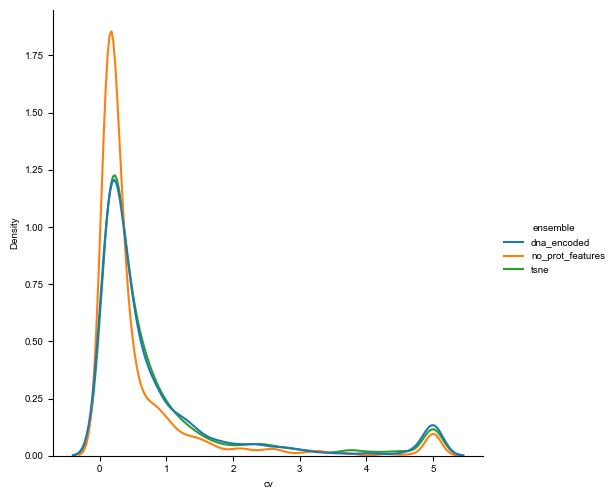

In [38]:
pred_df = test_converted[['rxn_id','ensemble','model_id','DNA_name','pmol_sub','pmol_sub_pred']].groupby(['rxn_id','ensemble','model_id','DNA_name']).agg('mean').reset_index()
pred_df = pred_df.set_index(['ensemble','model_id']).join(model_data.set_index(['ensemble','model_id'])).reset_index()
pred_df
stdevs = pred_df[['ensemble','rxn_id','pmol_sub_pred']].groupby(['ensemble','rxn_id']).agg('std')[['pmol_sub_pred']]
means = pred_df[['ensemble','rxn_id','pmol_sub_pred']].groupby(['ensemble','rxn_id']).agg('mean')[['pmol_sub_pred']]
calcs = means.join(stdevs,rsuffix='_stdev',lsuffix='_mean')
calcs['cv'] = abs(calcs['pmol_sub_pred_stdev'] / calcs['pmol_sub_pred_mean'])
# cvs.describe()
calcs['cv'] = calcs['cv'].clip(0,5)

calcs = pred_df.set_index(['ensemble','rxn_id']).join(calcs).reset_index()

sns.displot(data=calcs,x='cv',hue='ensemble',kind='kde',common_norm=False)
plt.show()


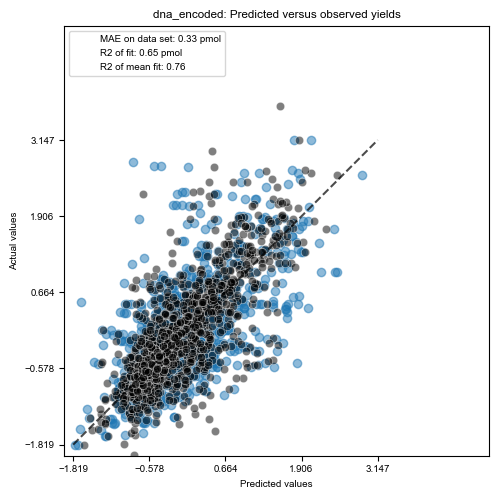

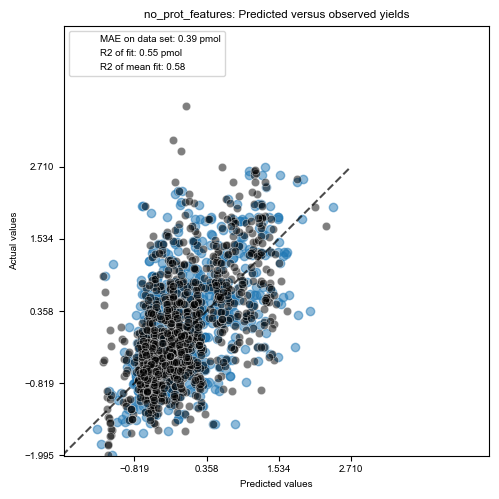

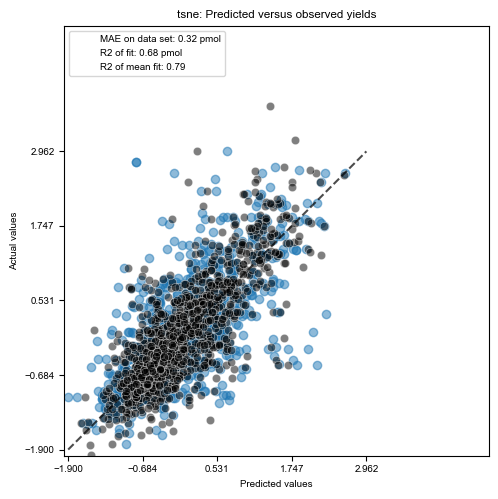

In [47]:
group_cols = ['DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']
temp = pred_df.set_index('rxn_id').join(test_converted[['rxn_id','Mg', 'SecYE', 'K', 'PEG','lipid']].set_index('rxn_id')).reset_index().copy()
for ensemble,ensemble_df in temp.groupby('ensemble'):
    mae_train = median_absolute_error(ensemble_df['pmol_sub'], ensemble_df['pmol_sub_pred'])
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(ensemble_df['pmol_sub'], ensemble_df['pmol_sub_pred'])
    
    t = ensemble_df.groupby(group_cols)[['pmol_sub','pmol_sub_pred']].agg('mean')
    slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = scipy.stats.linregress(t['pmol_sub'], t['pmol_sub_pred'])
    
    def abline(slope, intercept,ax):
        """Plot a line from slope and intercept"""
        axes = plt.gca()
        x_vals = np.array(axes.get_xlim())
        y_vals = intercept + slope * x_vals
        ax.plot(x_vals, y_vals, '--',color='red')
    # y_pred = model.predict(X_test[numerical_columns])
    # mae_test = median_absolute_error(y_test, y_pred)
    scores = {
        "MAE on data set": f"{mae_train:.2f} pmol",
        "R2 of fit": f"{r_value:.2f} pmol",
        "R2 of mean fit": f"{r_value_mean:.2f}",
    }

    _, ax = plt.subplots(figsize=(5, 5))
    display = PredictionErrorDisplay.from_predictions(
        ensemble_df['pmol_sub'], ensemble_df['pmol_sub_pred'], kind="actual_vs_predicted", ax=ax, scatter_kwargs={"alpha": 0.5}
    )
    sns.scatterplot(data=t,x='pmol_sub_pred',y='pmol_sub',color='black',alpha=0.5)
    
    # sns.scatterplot(data=test_converted,x='pmol_sub',y='pmol_sub_pred',alpha=0.05,ax=ax)
    ax.set_title(f"{ensemble}: Predicted versus observed yields")
    for name, score in scores.items():
        ax.plot([], [], " ", label=f"{name}: {score}")
    ax.legend(loc="upper left")
    plt.tight_layout()
    # plt.plot([-5,25],[-5,25],color='black',ls='--')
    # abline(slope, intercept,ax)

    plt.xlim([-2,5])
    plt.ylim([-2,5])
    plt.show()

In [49]:
group_cols = ['DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']

scores = []

for [ensemble,dna],dna_df in calcs.groupby(['ensemble','DNA_name']):
    mae_train = median_absolute_error(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    
    t = dna_df.groupby('rxn_id')[['pmol_sub','pmol_sub_pred']].agg('mean')
    mae_train_mean = median_absolute_error(t['pmol_sub'], t['pmol_sub_pred'])
    slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = scipy.stats.linregress(t['pmol_sub'], t['pmol_sub_pred'])
    scores.append([ensemble,dna,mae_train,r_value,mae_train_mean,r_value_mean])

scores_df = pd.DataFrame(scores,columns=['ensemble','DNA_name','mae','r_val','mae_mean','r_val_mean'])
scores_df

,ensemble,DNA_name,mae,r_val,mae_mean,r_val_mean
0,dna_encoded,AqpZ,0.242,0.793,0.191,0.820
1,dna_encoded,Aux,0.299,0.825,0.264,0.856
2,dna_encoded,B2AR,0.303,0.599,0.267,0.660
3,dna_encoded,B3AR,0.397,0.340,0.305,0.372
4,dna_encoded,Beta,0.365,0.721,0.356,0.762
...,...,...,...,...,...,...
79,tsne,OR1D2,0.461,0.547,0.499,0.585
80,tsne,OR1E1,0.463,0.614,0.441,0.670
81,tsne,OR2AG1,0.465,0.670,0.495,0.703
82,tsne,SecYE-G,0.282,0.777,0.219,0.808


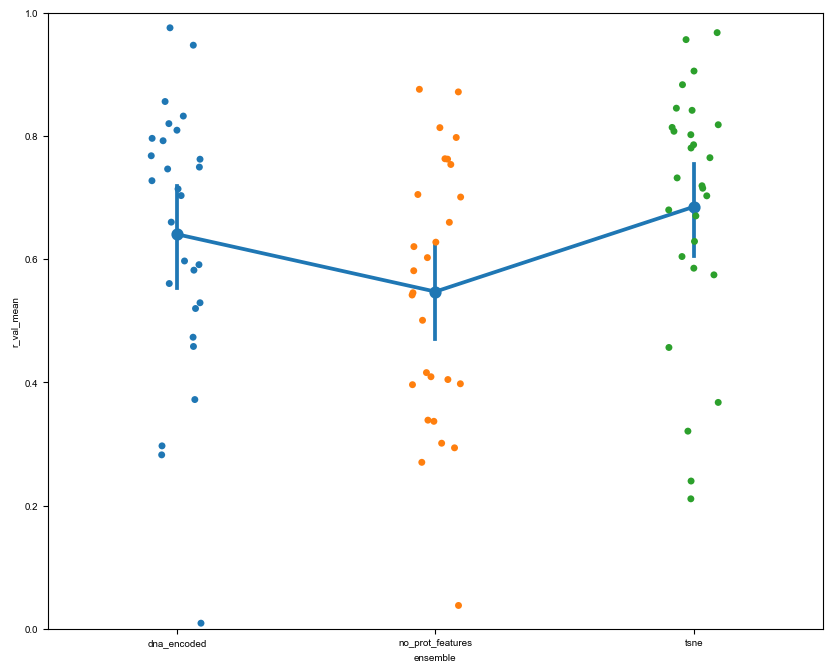

In [51]:
temp = scores_df[scores_df['ensemble'].isin(['dna_encoded','no_prot_features','tsne'])]

sns.stripplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'],hue='ensemble')
sns.pointplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'])
plt.ylim([0,1])
plt.show()

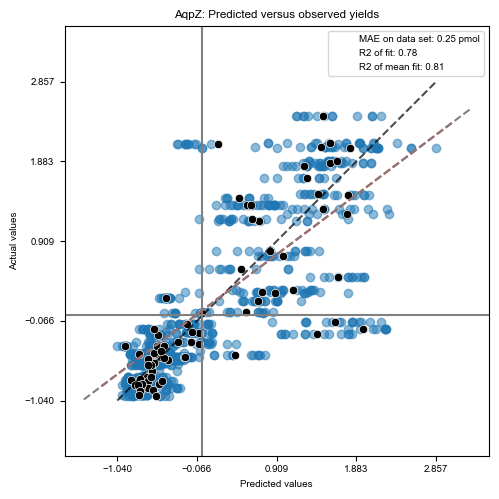

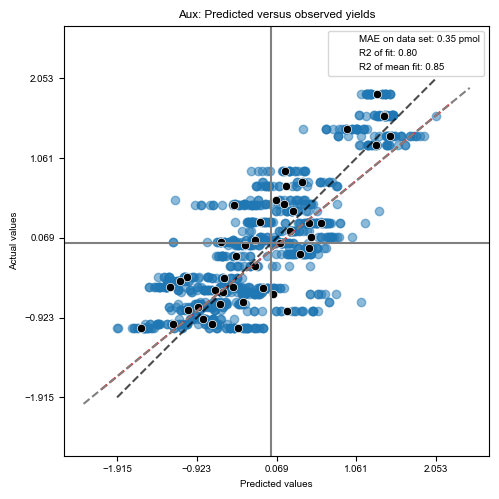

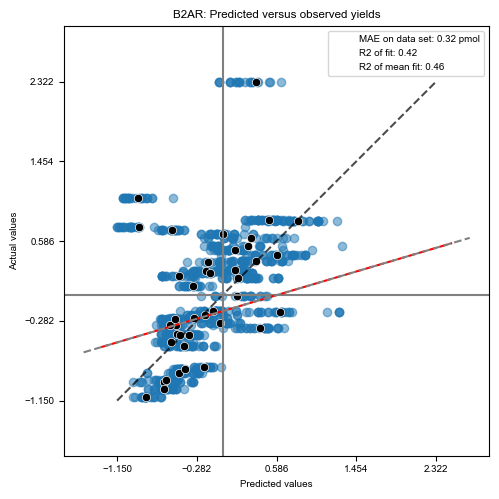

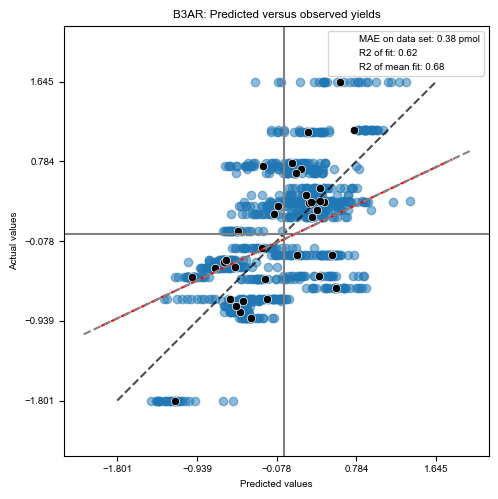

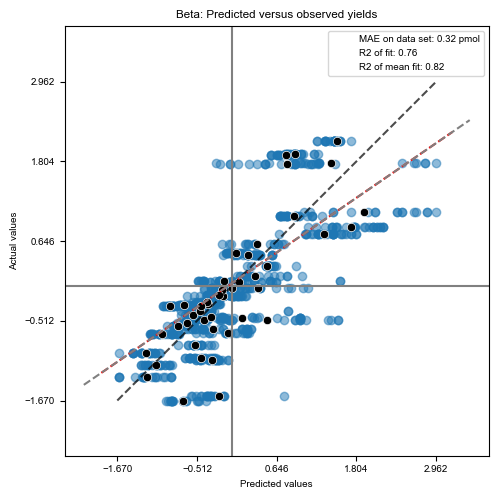

...

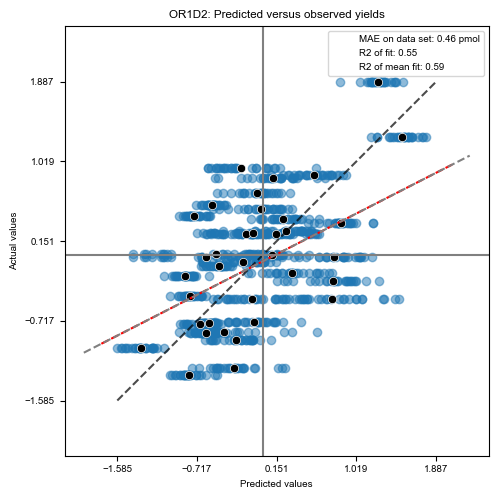

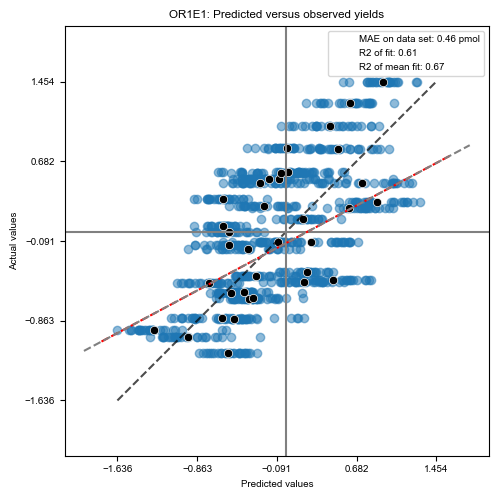

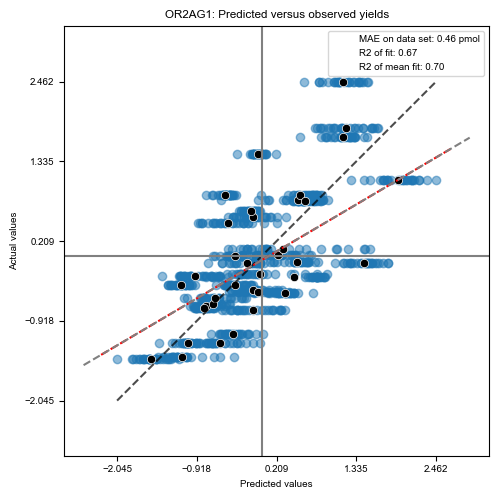

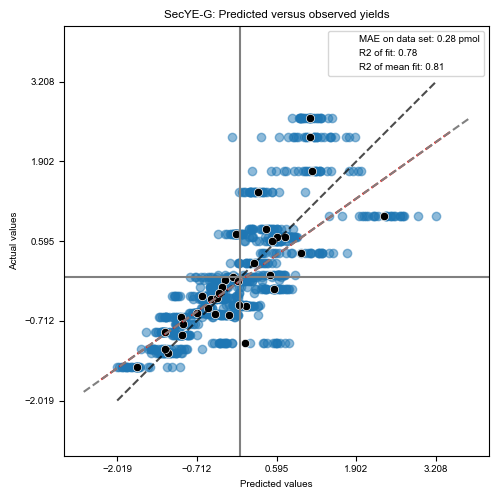

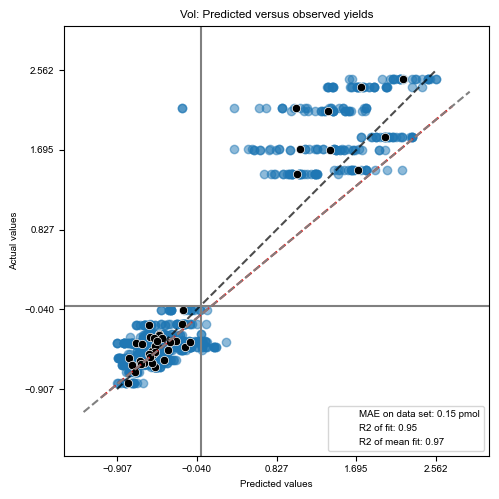

In [53]:
group_cols = ['DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']

for dna,dna_df in calcs[calcs['ensemble'] == 'tsne'].groupby('DNA_name'):
    mae_train = median_absolute_error(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    
    t = dna_df.groupby('rxn_id')[['pmol_sub','pmol_sub_pred']].agg('mean')
    slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = scipy.stats.linregress(t['pmol_sub'], t['pmol_sub_pred'])
    
    def abline(slope, intercept,ax,color='red'):
        """Plot a line from slope and intercept"""
        axes = plt.gca()
        x_vals = np.array(axes.get_xlim())
        y_vals = intercept + (slope * x_vals)
        ax.plot(x_vals, y_vals, '--',color=color)

    scores = {
        "MAE on data set": f"{mae_train:.2f} pmol",
        "R2 of fit": f"{r_value:.2f}",
        "R2 of mean fit": f"{r_value_mean:.2f}",
    }

    _, ax = plt.subplots(figsize=(5, 5))
    display = PredictionErrorDisplay.from_predictions(
        dna_df['pmol_sub'], dna_df['pmol_sub_pred'], kind="actual_vs_predicted", ax=ax, scatter_kwargs={"alpha": 0.5}
    )
    ax.set_title(f"{dna}: Predicted versus observed yields")
    for name, score in scores.items():
        ax.plot([], [], " ", label=f"{name}: {score}")
    ax.legend(loc="upper left")
    plt.tight_layout()
    # plt.plot([-5,25],[-5,25],color='black',ls='--')
    plt.axvline(0,color='grey')
    plt.axhline(0,color='grey')
    abline(slope, intercept,ax)
    upper = round(np.max(dna_df['pmol_sub'])*1.25)+1
    lower = round(np.min(dna_df['pmol_sub'])*0.75)-1
    
    sns.scatterplot(data=t,x='pmol_sub_pred',y='pmol_sub',color='black')
    abline(slope_mean, intercept_mean,ax,color='grey')
    # plt.xlim([lower,upper])
    # plt.ylim([lower,upper])
    plt.show()

In [54]:
holdout_preds = []

for i,row in model_data.iterrows():
    temp = all_features[all_features['DNA_name'] == row['holdout']].copy()
    # temp = temp_all[temp_all['rxn_id'].isin(fold_dict[model_data.iloc[0]['fold']]['test'])].copy()
    temp_norm = norm_data[norm_data['DNA_name'] == row['holdout']].copy()
    # temp_norm = temp_norm[temp_norm['rxn_id'].isin(fold_dict[model_data.iloc[0]['fold']]['test'])]
    preds = model_dict[row['model_id']].predict(temp_norm[row['cols']])
    temp['pred'] = preds
    temp['model_id'] = row['model_id']
    temp['ensemble'] = row['ensemble']
    temp['holdout'] = row['holdout']
    holdout_preds.append(temp)
    
holdout_preds = pd.concat(holdout_preds).reset_index(drop=True)

holdout_converted = []

for dna,dna_df in holdout_preds.groupby('DNA_name'):
    temp = dna_df.copy()
    temp['pmol_sub_pred'] = scaler_dict[dna].inverse_transform(np.array(temp[['pred']]))
    temp['label'] = scaler_dict[dna].transform(np.array(temp[['pmol']]))
    holdout_converted.append(temp)
    
holdout_converted = pd.concat(holdout_converted).reset_index(drop=True)
holdout_converted

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
7/7 ━━━━━━━━━━━━━━━

,DNA_name,rxn_id,lipid,Mg,SecYE,K,PEG,pmol,uniprot,Organism,...,DNA_name-SecYE-G,DNA_name-Vol,tsne_x,tsne_y,pred,model_id,ensemble,holdout,pmol_sub_pred,label
0,AqpZ,0.000,14,8.000,0.000,85,2.000,4.918,P60844,E. coli,...,0.000,0.000,0.865,1.166,-0.365,0,no_prot_features,AqpZ,6.379,-0.570
1,AqpZ,0.000,14,8.000,0.000,85,2.000,4.311,P60844,E. coli,...,0.000,0.000,0.865,1.166,-0.365,0,no_prot_features,AqpZ,6.379,-0.656
2,AqpZ,0.000,14,8.000,0.000,85,2.000,2.644,P60844,E. coli,...,0.000,0.000,0.865,1.166,-0.365,0,no_prot_features,AqpZ,6.379,-0.891
3,AqpZ,0.000,14,8.000,0.000,85,2.000,7.546,P60844,E. coli,...,0.000,0.000,0.865,1.166,-0.365,0,no_prot_features,AqpZ,6.379,-0.201
4,AqpZ,0.000,14,8.000,0.000,85,2.000,7.527,P60844,E. coli,...,0.000,0.000,0.865,1.166,-0.365,0,no_prot_features,AqpZ,6.379,-0.203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82585,Vol,3966.000,18,20.000,1.250,135,2.000,1.240,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.757,419,tsne,Vol,1.133,-0.656
82586,Vol,3966.000,18,20.000,1.250,135,2.000,1.230,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.757,419,tsne,Vol,1.133,-0.665
82587,Vol,3966.000,18,20.000,1.250,135,2.000,1.726,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.757,419,tsne,Vol,1.133,-0.194
82588,Vol,3966.000,18,20.000,1.250,135,2.000,1.145,Q5JW98,H. sapiens,...,0.000,1.000,1.234,0.377,-0.757,419,tsne,Vol,1.133,-0.745


In [55]:
holdout_converted['pmol_sub'] = holdout_converted['label']
holdout_converted['pmol_sub_pred'] = holdout_converted['pred']

In [57]:
holdout_converted.columns

Index(['DNA_name', 'rxn_id', 'lipid', 'Mg', 'SecYE', 'K', 'PEG', 'pmol',
       'uniprot', 'Organism', 'Length', 'tm_count', 'Mass',
       'Organism-A. thaliana', 'Organism-E. coli', 'Organism-H. sapiens',
       'DNA_name-AqpZ', 'DNA_name-Aux', 'DNA_name-AuxT1', 'DNA_name-B2AR',
       'DNA_name-B3AR', 'DNA_name-Beta', 'DNA_name-CD47', 'DNA_name-CD63',
       'DNA_name-CD81', 'DNA_name-CD9', 'DNA_name-CML1', 'DNA_name-CRCM',
       'DNA_name-CaM', 'DNA_name-Cx43', 'DNA_name-Dia', 'DNA_name-FFAR4',
       'DNA_name-FITM2', 'DNA_name-Glut', 'DNA_name-InP', 'DNA_name-Mito',
       'DNA_name-Mol', 'DNA_name-MscL', 'DNA_name-MtlA', 'DNA_name-Neu',
       'DNA_name-OR1A1', 'DNA_name-OR1D2', 'DNA_name-OR1E1', 'DNA_name-OR2AG1',
       'DNA_name-PPT1', 'DNA_name-SecYE-G', 'DNA_name-Vol', 'tsne_x', 'tsne_y',
       'pred', 'model_id', 'ensemble', 'holdout', 'pmol_sub_pred', 'label',
       'pmol_sub'],
      dtype='object')

In [69]:
holdout_df = holdout_converted[['rxn_id','ensemble','model_id','DNA_name','pmol','pmol_sub','pred','pmol_sub_pred']].groupby(['rxn_id','ensemble','model_id','DNA_name']).agg('mean').reset_index()
holdout_df = holdout_df.set_index(['ensemble','model_id']).join(model_data.set_index(['ensemble','model_id'])).reset_index()
holdout_df = pd.merge(holdout_df,holdout_converted[['rxn_id', 'lipid', 'Mg', 'SecYE', 'K', 'PEG']],on='rxn_id')
holdout_df

,ensemble,model_id,rxn_id,DNA_name,pmol,pmol_sub,pred,pmol_sub_pred,holdout,fold,...,learning_rate,nodes,cols,test_ids,train_ids,lipid,Mg,SecYE,K,PEG
0,dna_encoded,5,0.000,AqpZ,5.389,-0.504,-0.247,-0.247,AqpZ,0,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",14,8.000,0.000,85,2.000
1,dna_encoded,5,0.000,AqpZ,5.389,-0.504,-0.247,-0.247,AqpZ,0,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",14,8.000,0.000,85,2.000
2,dna_encoded,5,0.000,AqpZ,5.389,-0.504,-0.247,-0.247,AqpZ,0,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",14,8.000,0.000,85,2.000
3,dna_encoded,5,0.000,AqpZ,5.389,-0.504,-0.247,-0.247,AqpZ,0,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",14,8.000,0.000,85,2.000
4,dna_encoded,5,0.000,AqpZ,5.389,-0.504,-0.247,-0.247,AqpZ,0,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",14,8.000,0.000,85,2.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1238845,tsne,419,3966.000,Vol,1.263,-0.634,-0.757,-0.757,Vol,4,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",18,20.000,1.250,135,2.000
1238846,tsne,419,3966.000,Vol,1.263,-0.634,-0.757,-0.757,Vol,4,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",18,20.000,1.250,135,2.000
1238847,tsne,419,3966.000,Vol,1.263,-0.634,-0.757,-0.757,Vol,4,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",18,20.000,1.250,135,2.000
1238848,tsne,419,3966.000,Vol,1.263,-0.634,-0.757,-0.757,Vol,4,...,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",18,20.000,1.250,135,2.000


In [70]:
# real_values = sub_df[['DNA_name','Mg','K','SecYE','PEG','Liposome_name','label','mean_diff','score']].drop_duplicates()
real_values = sub_df[sub_df['label'] == 'screen'][['DNA_name','Mg','K','SecYE','PEG','Liposome_name','label','mean_diff','score']].drop_duplicates()
lipo_dict = {'DOPC':18,'DPPC':16,'DMPC':14}

real_values['lipid'] = real_values['Liposome_name'].apply(lambda x: lipo_dict[x])
real_values = real_values.drop(columns=['Liposome_name','label'])
real_values = real_values.groupby(['DNA_name','Mg','K','SecYE','PEG','lipid']).agg('mean').reset_index()
real_values
# # holdout_calcs = holdout_calcs.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid']).join(real_values.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid'])).reset_index().dropna()
holdout_df = holdout_df.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid']).join(real_values.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid'])).reset_index().dropna()
holdout_df

,DNA_name,Mg,K,SecYE,PEG,lipid,ensemble,model_id,rxn_id,pmol,...,holdout,fold,batch,learning_rate,nodes,cols,test_ids,train_ids,mean_diff,score
0,AqpZ,8.000,85,0.000,2.000,14,dna_encoded,5,0.000,5.389,...,AqpZ,0,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",3.599,1.000
1,AqpZ,8.000,85,0.000,2.000,14,dna_encoded,5,0.000,5.389,...,AqpZ,0,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",3.599,1.000
2,AqpZ,8.000,85,0.000,2.000,14,dna_encoded,5,0.000,5.389,...,AqpZ,0,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",3.599,1.000
3,AqpZ,8.000,85,0.000,2.000,14,dna_encoded,5,0.000,5.389,...,AqpZ,0,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",3.599,1.000
4,AqpZ,8.000,85,0.000,2.000,14,dna_encoded,5,0.000,5.389,...,AqpZ,0,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, DNA_name-AqpZ, DNA_...","[2831.0, 2998.0, 1217.0, 2621.0, 3562.0, 3039....","[2793.0, 1889.0, 1887.0, 3917.0, 1528.0, 1370....",3.599,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1238845,Vol,20.000,135,1.250,2.000,18,tsne,419,3966.000,1.263,...,Vol,4,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",-0.415,0.000
1238846,Vol,20.000,135,1.250,2.000,18,tsne,419,3966.000,1.263,...,Vol,4,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",-0.415,0.000
1238847,Vol,20.000,135,1.250,2.000,18,tsne,419,3966.000,1.263,...,Vol,4,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",-0.415,0.000
1238848,Vol,20.000,135,1.250,2.000,18,tsne,419,3966.000,1.263,...,Vol,4,50,0.001,"[512, 256, 128, 64, 32, 16]","[Mg, SecYE, K, PEG, lipid, tsne_x, tsne_y]","[1799.0, 561.0, 2109.0, 1743.0, 2793.0, 3600.0...","[2307.0, 2997.0, 2942.0, 544.0, 3332.0, 205.0,...",-0.415,0.000


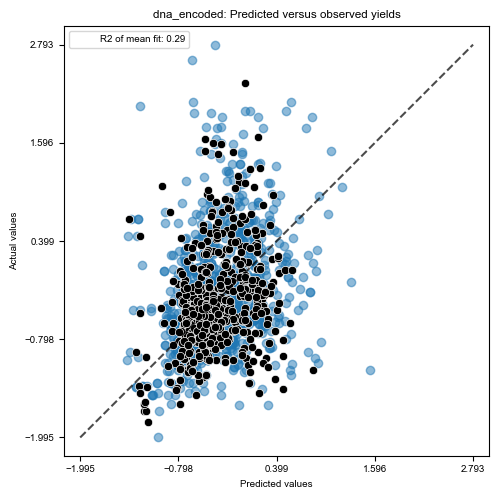

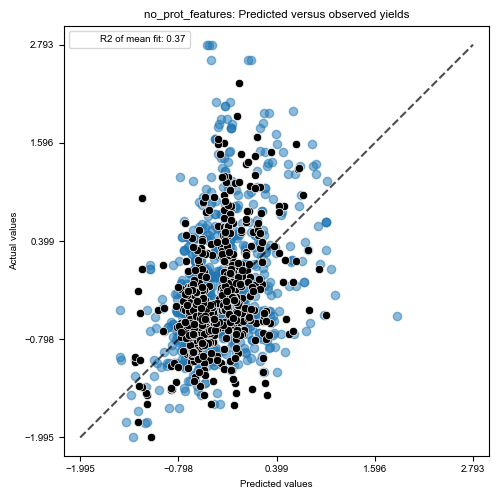

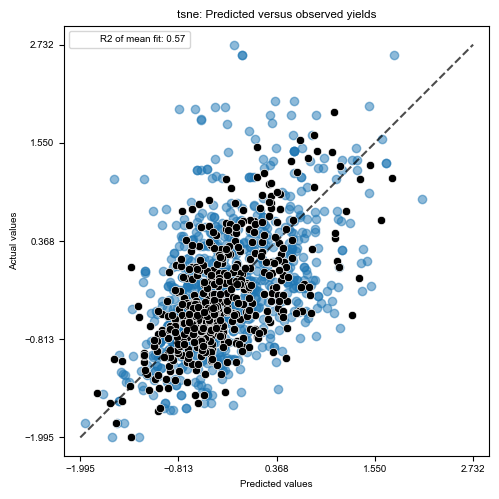

In [71]:
group_cols = ['DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']

for ensemble, ens_df in holdout_df.groupby('ensemble'):
    t = ens_df.groupby(group_cols)[['pmol_sub','pmol_sub_pred']].agg('mean')
    slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = scipy.stats.linregress(t['pmol_sub'], t['pmol_sub_pred'])

    def abline(slope, intercept,ax,color='red'):
            """Plot a line from slope and intercept"""
            axes = plt.gca()
            x_vals = np.array(axes.get_xlim())
            y_vals = intercept + slope * x_vals
            ax.plot(x_vals, y_vals, '--',color=color)
    # y_pred = model.predict(X_test[numerical_columns])
    # mae_test = median_absolute_error(y_test, y_pred)
    scores = {
        # "MAE on data set": f"{mae_train:.2f} pmol",
        # "R2 of fit": f"{r_value:.2f} pmol",
        "R2 of mean fit": f"{r_value_mean:.2f}",
    }

    _, ax = plt.subplots(figsize=(5, 5))
    display = PredictionErrorDisplay.from_predictions(
        ens_df['pmol_sub'], ens_df['pmol_sub_pred'], kind="actual_vs_predicted", ax=ax, scatter_kwargs={"alpha": 0.5}
    )
    sns.scatterplot(data=t.sample(500),x='pmol_sub_pred',y='pmol_sub',color='black')
    # abline(slope_mean, intercept_mean,ax,color='grey')

    # sns.scatterplot(data=test_converted,x='pmol_sub',y='pmol_sub_pred',alpha=0.05,ax=ax)
    ax.set_title(f"{ensemble}: Predicted versus observed yields")
    for name, score in scores.items():
        ax.plot([], [], " ", label=f"{name}: {score}")
    ax.legend(loc="upper left")
    plt.tight_layout()
    # plt.plot([-5,25],[-5,25],color='black',ls='--')
    # abline(slope, intercept,ax)

    # plt.xlim([-2,5])
    # plt.ylim([-2,5])
    plt.show()

In [73]:
group_cols = ['ensemble','DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']

means = holdout_df[group_cols+['pmol_sub_pred']].groupby(group_cols).agg('mean')[['pmol_sub_pred']]
stdevs = holdout_df[group_cols+['pmol_sub_pred']].groupby(group_cols).agg('std')[['pmol_sub_pred']]
calcs = means.join(stdevs,lsuffix='_mean',rsuffix='_stdev')


In [76]:
holdout_df.columns

Index(['DNA_name', 'Mg', 'K', 'SecYE', 'PEG', 'lipid', 'ensemble', 'model_id',
       'rxn_id', 'pmol', 'pmol_sub', 'pred', 'pmol_sub_pred', 'holdout',
       'fold', 'batch', 'learning_rate', 'nodes', 'cols', 'test_ids',
       'train_ids', 'mean_diff', 'score'],
      dtype='object')

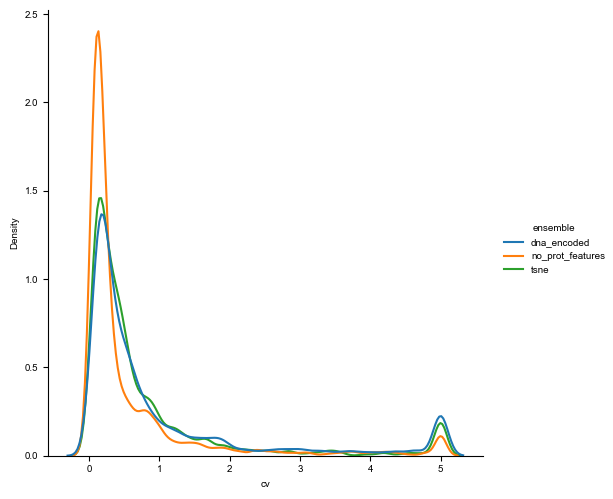

In [78]:
# holdout_df = holdout_converted.groupby(['rxn_id','ensemble','model_id','DNA_name']).agg('mean').reset_index()
# holdout_df = holdout_df.set_index(['ensemble','model_id']).join(model_data.set_index(['ensemble','model_id'])).reset_index()
# holdout_df = holdout_df.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid']).join(real_values.set_index(['DNA_name','Mg','K','SecYE','PEG','lipid'])).reset_index().dropna()

stdevs = holdout_df[['ensemble','rxn_id','pmol_sub_pred']].groupby(['ensemble','rxn_id']).agg('std')[['pmol_sub_pred']]
means = holdout_df[['ensemble','rxn_id','pmol_sub_pred']].groupby(['ensemble','rxn_id']).agg('mean')[['pmol_sub_pred']]
calcs = means.join(stdevs,rsuffix='_stdev',lsuffix='_mean')
calcs['cv'] = abs(calcs['pmol_sub_pred_stdev'] / calcs['pmol_sub_pred_mean'])
# cvs.describe()
calcs['cv'] = calcs['cv'].clip(0,5)

calcs = holdout_df.set_index(['ensemble','rxn_id']).join(calcs).reset_index()

sns.displot(data=calcs,x='cv',hue='ensemble',kind='kde',common_norm=False)
plt.show()

In [79]:
group_cols = ['DNA_name','Mg', 'SecYE', 'K', 'PEG','lipid']

scores = []

for [ensemble,dna],dna_df in calcs.groupby(['ensemble','DNA_name']):
    mae_train = median_absolute_error(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(dna_df['pmol_sub'], dna_df['pmol_sub_pred'])
    
    t = dna_df.groupby(group_cols)[['pmol_sub','pmol_sub_pred']].agg('mean')
    mae_train_mean = median_absolute_error(t['pmol_sub'], t['pmol_sub_pred'])
    slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = scipy.stats.linregress(t['pmol_sub'], t['pmol_sub_pred'])
    scores.append([ensemble,dna,mae_train,r_value,mae_train_mean,r_value_mean])

scores_df = pd.DataFrame(scores,columns=['ensemble','DNA_name','mae','r_val','mae_mean','r_val_mean'])
scores_df

,ensemble,DNA_name,mae,r_val,mae_mean,r_val_mean
0,dna_encoded,AqpZ,0.373,0.223,0.401,0.293
1,dna_encoded,Aux,0.398,0.338,0.331,0.351
2,dna_encoded,B2AR,0.356,0.446,0.412,0.502
3,dna_encoded,B3AR,0.397,0.561,0.346,0.612
4,dna_encoded,Beta,0.329,0.437,0.366,0.501
...,...,...,...,...,...,...
79,tsne,OR1D2,0.538,0.455,0.505,0.411
80,tsne,OR1E1,0.388,0.707,0.325,0.747
81,tsne,OR2AG1,0.447,0.479,0.389,0.582
82,tsne,SecYE-G,0.247,0.773,0.166,0.829


In [80]:
scores_df.value_counts(['ensemble'])

ensemble        
dna_encoded         28
no_prot_features    28
tsne                28
Name: count, dtype: int64

In [83]:
# low = ['B3AR','CML1','CRCM','Cx43','FFAR4','Neu','OR1D2','OR1E1','OR2AG1','Vol']
low = ['B2AR','B3AR','CD63','CD81','CML1','CRCM','Cx43','FFAR4','Neu','OR1D2','OR1E1','OR2AG1']


In [81]:
t = scores_df[scores_df['ensemble'].isin(['dna_encoded','no_prot_features','tsne'])]
# t = t[~t['DNA_name'].isin(low)]

dna = t[t['ensemble'] == 'dna_encoded']
no_prot = t[t['ensemble'] == 'no_prot_features']
perp = t[t['ensemble'] == 'tsne']

perp_dna = ttest_ind(perp['r_val_mean'],dna['r_val_mean'])[1]
per_diff = (perp['r_val_mean'].mean() - dna['r_val_mean'].mean()) / dna['r_val_mean'].mean() *100
print(f'tsne-_no_dna - p-val:{perp_dna}   diff:{per_diff}%')

perp_no = ttest_ind(perp['r_val_mean'],no_prot['r_val_mean'])[1]
per_diff = (perp['r_val_mean'].mean() - no_prot['r_val_mean'].mean()) / no_prot['r_val_mean'].mean() *100
print(f'tsne-no_prot - p-val:{perp_no}   diff:{per_diff}%')

no_dna = ttest_ind(no_prot['r_val_mean'],dna['r_val_mean'])[1]
per_diff = (no_prot['r_val_mean'].mean() - dna['r_val_mean'].mean()) / dna['r_val_mean'].mean() *100
print(f'no_prot-dna - p-val:{no_dna}   diff:{per_diff}%')

tsne-_no_dna - p-val:0.00027432969185172616   diff:62.32101843691586%
tsne-no_prot - p-val:0.008503164092848193   diff:34.2815962486202%
no_prot-dna - p-val:0.1743569133120005   diff:20.881061122017876%


C:\Users\conar\AppData\Local\Temp\ipykernel_11592\2971299131.py:7: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'],scale=0.8,errwidth=2,color='black')
C:\Users\conar\AppData\Local\Temp\ipykernel_11592\2971299131.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.pointplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'],scale=0.8,errwidth=2,color='black')


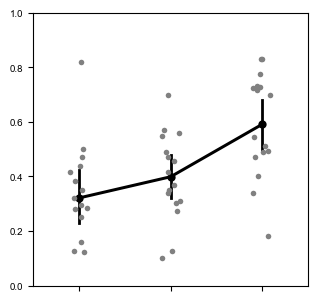

In [84]:
temp = scores_df[scores_df['ensemble'].isin(['dna_encoded','no_prot_features','tsne'])]
temp = temp[~temp['DNA_name'].isin(low)]

fig,ax = plt.subplots(figsize=[9*cm,9*cm])

sns.stripplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'],s=4,color='grey')
sns.pointplot(data=temp,x='ensemble',y='r_val_mean',order=['dna_encoded','no_prot_features','tsne'],scale=0.8,errwidth=2,color='black')

plt.ylim([0,1])
plt.xlabel('')
plt.ylabel('')
ax.set(xticklabels=[])
# plt.savefig(f'{fig_folder}/Fig4B-ensemble_comparison_high_0to1.svg',format='svg',dpi=300)
plt.show()

# temp.set_index('ensemble').to_excel(f'{data_folder}/Fig4B-ensemble_R2_values.xlsx')